# The DAX "Prophet"

* DAX = German index. Not the ETF named "DAX" (pitfall)
* Data source: FMP (you can use yfinance)


* Purpose of this NB: swing trade support (weeks)
* Model can detect seasonalities

## Data retrieval ($)

We want historical data for our model. This isn't free.

In [7]:
from openbb import obb
import os
from dotenv import load_dotenv

def read_api_keys_from_env():
    """
    Read API keys from env
    """
    load_dotenv("api_keys")  # This loads the variables from the file
    
    obb.user.credentials.nasdaq_api_key = os.getenv('NASDAQ_API_KEY') or print("NASDAQ_API_KEY is not set or empty") or None
    obb.user.credentials.fmp_api_key = os.getenv('FMP_API_KEY') or print("FMP_API_KEY is not set or empty") or None
    obb.user.credentials.econdb_api_key = os.getenv('ECONDB_API_KEY') or print("ECONDB_API_KEY is not set or empty") or None
    obb.user.credentials.fred_api_key = os.getenv('FRED_API_KEY') or print("FRED_API_KEY is not set or empty") or None
    obb.user.credentials.intrinio_api_key = os.getenv('INTRINIO_API_KEY') or print("INTRINIO_API_KEY is not set or empty") or None
    obb.user.credentials.polygon_api_key = os.getenv('POLYGON_API_KEY') or print("POLYGON_API_KEY is not set or empty") or None
    
read_api_keys_from_env()

In [31]:
def get_dax_data(symbol : str):

    df_daily = obb.equity.price.historical(symbol = symbol, provider="fmp",start_date="2000-01-01").to_df()
    return df_daily

# https://site.financialmodelingprep.com/index-summary/%5EGDAXI 
# https://de.finance.yahoo.com/quote/%5EGDAXI/ 
df = get_dax_data("^GDAXI") # Not "DAX", which is an ETF

In [32]:
df.tail(1)

,open,high,low,close,volume,vwap,adj_close,unadjusted_volume,change,change_percent
date,,,,,,,,,,
2024-08-23,18538.86914,18670.44922,18519.28906,18633.09961,41122500,18590.43,18633.09961,41122500.0,94.23047,0.005083


In [33]:
df.head(1)

,open,high,low,close,volume,vwap,adj_close,unadjusted_volume,change,change_percent
date,,,,,,,,,,
2000-01-03,6961.720215,7159.330078,6720.870117,6750.759766,43072500,6876.98665,6750.759766,43072500.0,-210.96045,-0.0303


In [34]:
df.to_csv("GDAXI_Jan_2k_Aug24.csv")

# Load the data (local file)

* Data is present in the CSV

In [22]:
import pandas as pd


gdax_df = pd.read_csv("GDAXI_Jan_2k_Aug24.csv")

In [23]:
gdax_df.tail(1)

,date,open,high,low,close,volume,vwap,adj_close,unadjusted_volume,change,change_percent
6260,2024-08-23,18538.86914,18670.44922,18519.28906,18633.09961,41122500,18590.43,18633.09961,41122500.0,94.23047,0.005083


In [24]:
gdax_df.head(1)

,date,open,high,low,close,volume,vwap,adj_close,unadjusted_volume,change,change_percent
0,2000-01-03,6961.720215,7159.330078,6720.870117,6750.759766,43072500,6876.98665,6750.759766,43072500.0,-210.96045,-0.0303


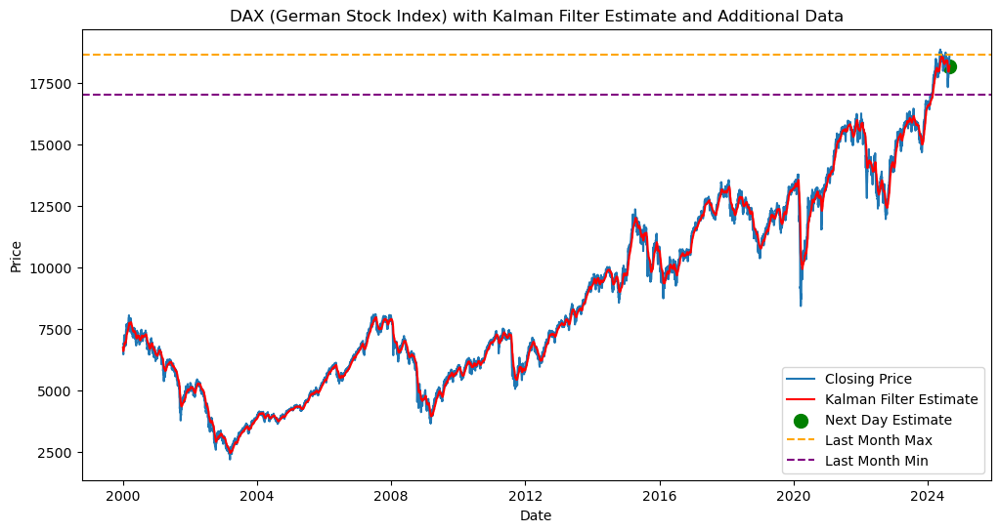

Last 5 days of complete data:
                  close  KalmanEstimate
date                                   
2024-08-20  18357.51953    18083.979993
2024-08-21  18448.94922    18118.697662
2024-08-22  18493.39063    18154.340301
2024-08-23  18633.09961    18199.882243
2024-08-24          NaN    18199.882243

Last complete day in dataset:
open    NaN
high    NaN
low     NaN
close   NaN
Name: 2024-08-24 00:00:00, dtype: float64

Next day estimate: 18199.88
Estimate uncertainty: 0.32

Last month's maximum price: 18670.45

Last month's minimum price: 17024.82

Data range: from 2000-01-03 to 2024-08-24

Current date and time: 2024-08-25 06:54:51.729938


In [5]:
import numpy as np
import pandas as pd
from pykalman import KalmanFilter
import matplotlib.pyplot as plt
from datetime import timedelta, datetime

# Read the DAX data from the CSV file
df = pd.read_csv("GDAXI_Jan_2k_Aug24.csv", parse_dates=['date'], index_col='date')

# Remove any rows with NaN values and get the latest complete day
df = df.dropna()
latest_complete_day = df.index[-1]

# Ensure we're only working with complete data up to the latest complete day
df = df[:latest_complete_day]

# Initialize Kalman Filter
kf = KalmanFilter(
    initial_state_mean=df['close'].iloc[0],
    initial_state_covariance=1,
    transition_matrices=[1],
    observation_matrices=[1],
    observation_covariance=1,
    transition_covariance=0.01
)

# Apply Kalman Filter
state_means, state_covariances = kf.filter(df['close'])

# Add Kalman Filter estimates to the dataframe
df['KalmanEstimate'] = state_means

# Get the next day estimate
last_mean = state_means[-1]
last_covariance = state_covariances[-1]
next_mean, next_covariance = kf.filter_update(
    filtered_state_mean=last_mean,
    filtered_state_covariance=last_covariance
)

# Add the next day estimate to the dataframe
next_day = latest_complete_day + timedelta(days=1)
df.loc[next_day, 'KalmanEstimate'] = next_mean[0]

# Calculate last month's max and min
last_month_start = latest_complete_day - timedelta(days=30)
last_month = df.loc[last_month_start:]
last_month_max = last_month['high'].max()
last_month_min = last_month['low'].min()

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['close'], label='Closing Price')
plt.plot(df.index, df['KalmanEstimate'], label='Kalman Filter Estimate', color='red')
plt.scatter(next_day, next_mean, color='green', s=100, label='Next Day Estimate')

# Add horizontal lines for last month's max and min
plt.axhline(y=last_month_max, color='orange', linestyle='--', label='Last Month Max')
plt.axhline(y=last_month_min, color='purple', linestyle='--', label='Last Month Min')

plt.title('DAX (German Stock Index) with Kalman Filter Estimate and Additional Data')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print the last few days of data and the next day estimate
print("Last 5 days of complete data:")
print(df[['close', 'KalmanEstimate']].tail())

print(f"\nLast complete day in dataset:")
print(df[['open', 'high', 'low', 'close']].iloc[-1])

print(f"\nNext day estimate: {next_mean[0]:.2f}")
print(f"Estimate uncertainty: {np.sqrt(next_covariance[0][0]):.2f}")

print(f"\nLast month's maximum price: {last_month_max:.2f}")
print(f"\nLast month's minimum price: {last_month_min:.2f}")

# Print the date range of the data
print(f"\nData range: from {df.index[0].date()} to {df.index[-1].date()}")

print(f"\nCurrent date and time: {datetime.now()}")

# Get foundational features ($)

We are going to enrich our dataset with

* Export stats
* Inflation

https://www.econdb.com/series/REXPDE/germany-real-exports-of-goods-and-services/?from=2019-08-25&to=2024-08-25 

In [6]:
from openbb import obb

In [16]:
import pandas as pd

# define API_TOKEN

export_stats_usd_de_df = pd.read_csv(
    'https://www.econdb.com/api/series/REXPDE~TUSD/?token=%s&format=csv' % API_TOKEN,
    index_col='Date', parse_dates=['Date'])

In [17]:
export_stats_usd_df.tail(1)

,REXPDE~TUSD
Date,
2024-01-01,441754.0


In [25]:
export_stats_usd_df.head(5)

,REXPDE~TUSD
Date,
1991-01-01,NaN
1991-04-01,NaN
1991-07-01,NaN
1991-10-01,NaN
1992-01-01,NaN


In [32]:
import pandas as pd

API_TOKEN = '964268845594aabc3fdc5fb6e47a4184256d1a35'

consumer_price_index_de_df = pd.read_csv(
    'https://www.econdb.com/api/series/CPIDE/?token=%s&format=csv' % API_TOKEN,
    index_col='Date', parse_dates=['Date'])

In [33]:
consumer_price_index_de_df.head(1)

,CPIDE
Date,
2012-03-01,91.7


In [34]:
consumer_price_index_de_df.tail(1)

,CPIDE
Date,
2024-07-01,119.8


# Combine the datasets

In [39]:
import pandas as pd


# Ensure export_stats_usd_de_df and consumer_price_index_de_df have datetime index
export_stats_usd_de_df.index = pd.to_datetime(export_stats_usd_de_df.index)
consumer_price_index_de_df.index = pd.to_datetime(consumer_price_index_de_df.index)

# Resample export_stats_usd_de_df to daily frequency and forward fill
export_stats_daily = export_stats_usd_de_df.resample('D').ffill()

# Resample consumer_price_index_de_df to daily frequency and forward fill
cpi_daily = consumer_price_index_de_df.resample('D').ffill()

# Merge all dataframes
combined_df = gdax_df.join([export_stats_daily, cpi_daily], how='outer')

# Forward fill any remaining NaN values
combined_df = combined_df.ffill()

# If you want 'date' as a column instead of index
combined_df = combined_df.reset_index()

# Display the first few rows of the combined dataframe
print(combined_df.tail())

# Display info about the combined dataframe
print(combined_df.info())

           index         open         high          low        close  \
12271 2024-08-19  18312.50977  18454.93945  18284.85938  18421.68945   
12272 2024-08-20  18473.23047  18495.27930  18349.98047  18357.51953   
12273 2024-08-21  18358.78906  18476.63086  18352.18945  18448.94922   
12274 2024-08-22  18459.27930  18551.39063  18458.60938  18493.39063   
12275 2024-08-23  18538.86914  18670.44922  18519.28906  18633.09961   

           volume      vwap    adj_close  unadjusted_volume     change  \
12271  43769700.0  18368.50  18421.68945         43769700.0  109.17968   
12272  42912000.0  18419.00  18357.51953         42912000.0 -115.71094   
12273  36068100.0  18409.14  18448.94922         36068100.0   90.16016   
12274  40950900.0  18490.67  18493.39063         40950900.0   34.11133   
12275  41122500.0  18590.43  18633.09961         41122500.0   94.23047   

       change_percent  REXPDE~TUSD  CPIDE  
12271        0.005962     441754.0  119.8  
12272       -0.006264     441754.0

In [42]:
import pandas as pd
import numpy as np
from pykalman import KalmanFilter
import talib

# Function to calculate Lorentzian indicator
def calculate_lorentzian(data, period=14):
    high_low = data['high'] - data['low']
    high_close = np.abs(data['high'] - data['close'].shift())
    low_close = np.abs(data['low'] - data['close'].shift())
    ranges = pd.concat([high_low, high_close, low_close], axis=1)
    true_range = np.max(ranges, axis=1)
    atr = talib.SMA(true_range, timeperiod=period)
    lorentzian = np.log(1 + atr)
    return lorentzian

# Assuming gdax_df is your DAX data
# Ensure gdax_df has 'date' as index and contains 'open', 'high', 'low', 'close' columns

# Calculate Kalman Filter estimates
kf = KalmanFilter(
    initial_state_mean=gdax_df['close'].iloc[0],
    initial_state_covariance=1,
    transition_matrices=[1],
    observation_matrices=[1],
    observation_covariance=1,
    transition_covariance=0.01
)

state_means, _ = kf.filter(gdax_df['close'])
gdax_df['KalmanEstimate'] = state_means

# Calculate Lorentzian indicator
gdax_df['LorentzianIndicator'] = calculate_lorentzian(gdax_df)

# Ensure export_stats_usd_de_df and consumer_price_index_de_df have datetime index
export_stats_usd_de_df.index = pd.to_datetime(export_stats_usd_de_df.index)
consumer_price_index_de_df.index = pd.to_datetime(consumer_price_index_de_df.index)

# Resample export_stats_usd_de_df to daily frequency and forward fill
export_stats_daily = export_stats_usd_de_df.resample('D').ffill()

# Resample consumer_price_index_de_df to daily frequency and forward fill
cpi_daily = consumer_price_index_de_df.resample('D').ffill()

# Merge all dataframes
combined_df = gdax_df.join([export_stats_daily, cpi_daily], how='outer')

# Forward fill any remaining NaN values
combined_df = combined_df.ffill()

# If you want 'date' as a column instead of index
combined_df = combined_df.reset_index()

# Display the first few rows of the combined dataframe
print(combined_df.tail())

# Display info about the combined dataframe
print(combined_df.info())

           index         open         high          low        close  \
12271 2024-08-19  18312.50977  18454.93945  18284.85938  18421.68945   
12272 2024-08-20  18473.23047  18495.27930  18349.98047  18357.51953   
12273 2024-08-21  18358.78906  18476.63086  18352.18945  18448.94922   
12274 2024-08-22  18459.27930  18551.39063  18458.60938  18493.39063   
12275 2024-08-23  18538.86914  18670.44922  18519.28906  18633.09961   

           volume      vwap    adj_close  unadjusted_volume     change  \
12271  43769700.0  18368.50  18421.68945         43769700.0  109.17968   
12272  42912000.0  18419.00  18357.51953         42912000.0 -115.71094   
12273  36068100.0  18409.14  18448.94922         36068100.0   90.16016   
12274  40950900.0  18490.67  18493.39063         40950900.0   34.11133   
12275  41122500.0  18590.43  18633.09961         41122500.0   94.23047   

       change_percent  KalmanEstimate  LorentzianIndicator  REXPDE~TUSD  CPIDE  
12271        0.005962    18055.224170    

# Now we fit Prophet

Using regressors: ['open', 'high', 'low', 'volume', 'vwap', 'adj_close', 'unadjusted_volume', 'change', 'change_percent', 'KalmanEstimate', 'LorentzianIndicator', 'REXPDE~TUSD', 'CPIDE']


07:41:25 - cmdstanpy - INFO - Chain [1] start processing
07:41:32 - cmdstanpy - INFO - Chain [1] done processing



Model Results:
Root Mean Squared Error: 0.24804108650748838
Mean Absolute Error: 0.2048658067697176


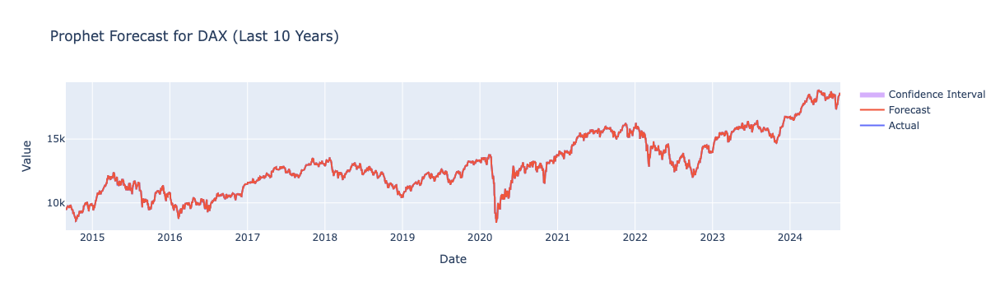

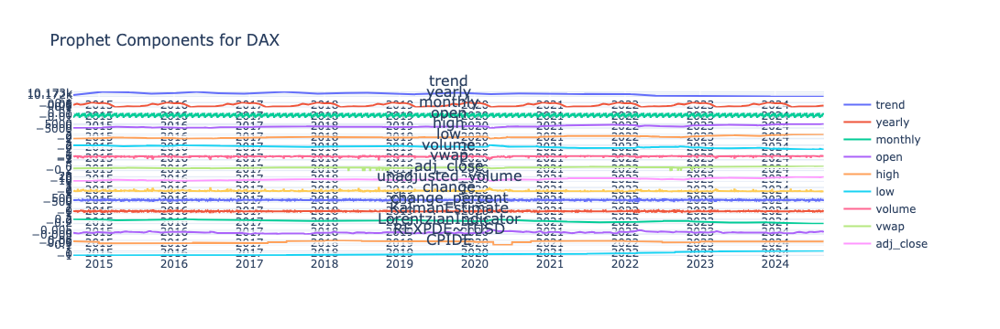


Regressor Importance:
              regressor    importance
11          REXPDE~TUSD  4.103350e-06
10  LorentzianIndicator  2.511120e-06
1                  high  2.672140e-07
0                  open  2.117290e-07
4                  vwap  1.987640e-07
2                   low  1.879990e-07
5             adj_close  1.869090e-07
12                CPIDE  1.220440e-07
3                volume  1.031160e-07
7                change  9.281980e-08
8        change_percent  7.484040e-08
6     unadjusted_volume  6.869890e-08
9        KalmanEstimate  1.725580e-08


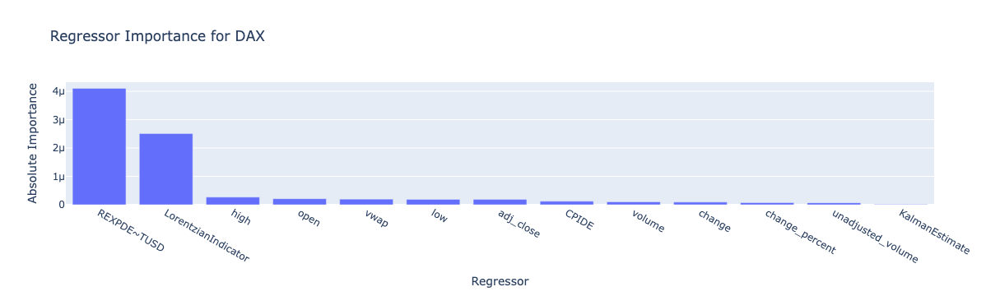

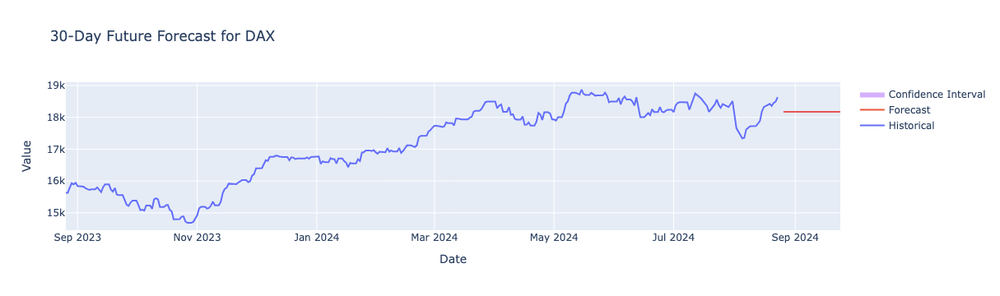


Future Predictions (next 30 days):
           ds          yhat    yhat_lower    yhat_upper
0  2024-08-26  18170.678657  18164.253351  18177.057699
1  2024-08-27  18170.686485  18163.981210  18177.148656
2  2024-08-28  18170.692456  18164.066814  18176.680111
3  2024-08-29  18170.694506  18164.437891  18176.927894
4  2024-08-30  18170.714034  18164.097301  18177.044645
5  2024-08-31  18170.714923  18164.594100  18177.141598
6  2024-09-01  18170.715027  18164.183054  18176.739334
7  2024-09-02  18170.711409  18164.515832  18176.708640
8  2024-09-03  18170.710695  18164.472544  18177.269812
9  2024-09-04  18170.708648  18164.598305  18177.691686
10 2024-09-05  18170.705081  18164.318580  18177.361395
11 2024-09-06  18170.722264  18164.588485  18177.044196
12 2024-09-07  18170.724344  18164.534186  18177.140781
13 2024-09-08  18170.728960  18164.225945  18176.747868
14 2024-09-09  18170.732106  18164.061719  18176.914615
15 2024-09-10  18170.738241  18164.428694  18176.610560
16 2024-09-1

In [45]:
from prophet import Prophet
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import datetime, timedelta

# Assuming your dataframe is named combined_df
df = combined_df.copy()

# Convert 'index' to datetime if it's not already
df['index'] = pd.to_datetime(df['index'])

# Filter for the last 10 years of data
ten_years_ago = datetime.now() - timedelta(days=365*10)
df = df[df['index'] >= ten_years_ago]

# Remove rows with NaN values
df = df.dropna()

# Rename columns to match Prophet's requirements
df = df.rename(columns={'index': 'ds', 'close': 'y'})

# Define potential regressors (all columns except 'ds' and 'y')
regressors = [col for col in df.columns if col not in ['ds', 'y']]

def train_prophet_model(df, regressors, include_monthly_seasonality=True):
    model = Prophet(
        yearly_seasonality=True,
        daily_seasonality=True,
        weekly_seasonality=True,
        changepoint_prior_scale=0.05,
        seasonality_prior_scale=10.0,
        seasonality_mode='additive'
    )
    
    if include_monthly_seasonality:
        model.add_seasonality(name='monthly', period=30.5, fourier_order=5)
    
    for regressor in regressors:
        if regressor in df.columns:
            model.add_regressor(regressor)
    
    model.fit(df)
    return model

# Filter regressors to only include those present in the dataframe
regressors = [reg for reg in regressors if reg in df.columns]
print(f"Using regressors: {regressors}")

# Train the model
model = train_prophet_model(df, regressors)

# Get current date
current_date = datetime.now().date()

# Make predictions up to the current date
future = model.make_future_dataframe(periods=0)  # No future predictions
future = future.merge(df[['ds'] + regressors], on='ds', how='left')
forecast = model.predict(future)

# Evaluate the model
y_true = df['y'].values
y_pred = forecast['yhat'].values
mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_true, y_pred)

print(f"\nModel Results:")
print(f"Root Mean Squared Error: {rmse}")
print(f"Mean Absolute Error: {mae}")

# Plot the results with Plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['ds'], y=df['y'], mode='lines', name='Actual'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], mode='lines', name='Forecast'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], mode='lines', line=dict(width=0), showlegend=False))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], mode='lines', fill='tonexty', line=dict(width=0), name='Confidence Interval'))
fig.update_layout(title='Prophet Forecast for DAX (Last 10 Years)', xaxis_title='Date', yaxis_title='Value', hovermode='x unified')
fig.update_xaxes(range=[df['ds'].min(), current_date])
fig.show()

# Plot component-wise effects
component_names = ['trend', 'yearly', 'monthly'] + regressors
fig = make_subplots(rows=len(component_names), cols=1, subplot_titles=component_names)
for i, component in enumerate(component_names, 1):
    fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast[component], mode='lines', name=component), row=i, col=1)
fig.update_layout(height=300*len(component_names), title_text="Prophet Components for DAX", hovermode='x unified')
fig.update_xaxes(range=[df['ds'].min(), current_date])
fig.show()

# Analyze regressor importance
if regressors:
    beta_values = model.params['beta'].flatten()
    regressor_importance = pd.DataFrame({
        'regressor': regressors,
        'importance': np.abs(beta_values[:len(regressors)])
    })
    regressor_importance = regressor_importance.sort_values('importance', ascending=False)
    print("\nRegressor Importance:")
    print(regressor_importance)

    # Plot regressor importance
    fig = go.Figure([go.Bar(x=regressor_importance['regressor'], y=regressor_importance['importance'])])
    fig.update_layout(title='Regressor Importance for DAX', xaxis_title='Regressor', yaxis_title='Absolute Importance')
    fig.show()
else:
    print("\nNo regressors were included in the model.")

# Make future predictions (next 30 days)
future_dates = pd.date_range(start=current_date + timedelta(days=1), periods=30)
future_df = pd.DataFrame({'ds': future_dates})

# Estimate future regressor values (using last 30 days average)
for regressor in regressors:
    future_df[regressor] = df[regressor].tail(30).mean()

future_forecast = model.predict(future_df)

# Plot future predictions
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['ds'].tail(365), y=df['y'].tail(365), mode='lines', name='Historical'))
fig.add_trace(go.Scatter(x=future_forecast['ds'], y=future_forecast['yhat'], mode='lines', name='Forecast'))
fig.add_trace(go.Scatter(x=future_forecast['ds'], y=future_forecast['yhat_lower'], mode='lines', line=dict(width=0), showlegend=False))
fig.add_trace(go.Scatter(x=future_forecast['ds'], y=future_forecast['yhat_upper'], mode='lines', fill='tonexty', line=dict(width=0), name='Confidence Interval'))
fig.update_layout(title='30-Day Future Forecast for DAX', xaxis_title='Date', yaxis_title='Value', hovermode='x unified')
fig.update_xaxes(range=[current_date - timedelta(days=365), future_dates[-1]])
fig.show()

print("\nFuture Predictions (next 30 days):")
print(future_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

Selected features: ['REXPDE~TUSD', 'LorentzianIndicator', 'CPIDE', 'volume']


08:28:23 - cmdstanpy - INFO - Chain [1] start processing
08:28:25 - cmdstanpy - INFO - Chain [1] done processing



Historical Fit Performance Metrics:
MSE: 203895.91
RMSE: 451.55
MAE: 356.90
MAPE: nan%

Cross-validation parameters:
Initial: 1823 days
Period: 182 days
Horizon: 364 days


  0%|          | 0/9 [00:00<?, ?it/s]

08:28:25 - cmdstanpy - INFO - Chain [1] start processing
08:28:26 - cmdstanpy - INFO - Chain [1] done processing
08:28:26 - cmdstanpy - INFO - Chain [1] start processing
08:28:27 - cmdstanpy - INFO - Chain [1] done processing
08:28:27 - cmdstanpy - INFO - Chain [1] start processing
08:28:27 - cmdstanpy - INFO - Chain [1] done processing
08:28:28 - cmdstanpy - INFO - Chain [1] start processing
08:28:28 - cmdstanpy - INFO - Chain [1] done processing
08:28:29 - cmdstanpy - INFO - Chain [1] start processing
08:28:29 - cmdstanpy - INFO - Chain [1] done processing
08:28:30 - cmdstanpy - INFO - Chain [1] start processing
08:28:30 - cmdstanpy - INFO - Chain [1] done processing
08:28:31 - cmdstanpy - INFO - Chain [1] start processing
08:28:31 - cmdstanpy - INFO - Chain [1] done processing
08:28:32 - cmdstanpy - INFO - Chain [1] start processing
08:28:32 - cmdstanpy - INFO - Chain [1] done processing
08:28:33 - cmdstanpy - INFO - Chain [1] start processing
08:28:33 - cmdstanpy - INFO - Chain [1]


Cross-Validation Performance Metrics:
horizon    200 days 12:00:00
mse           3617848.201129
rmse             1871.945615
mae              1396.358278
mape                0.100928
dtype: object


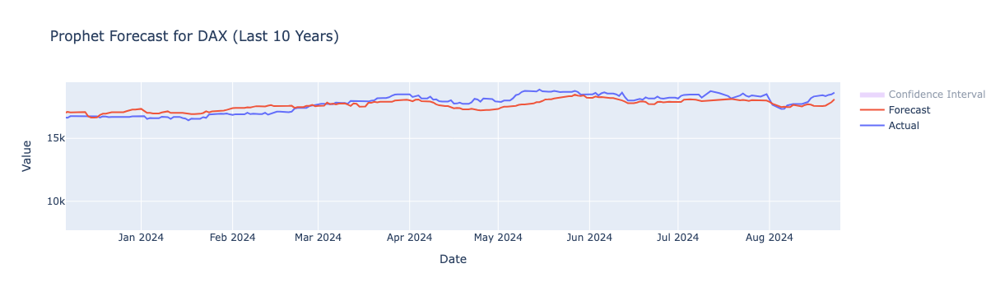

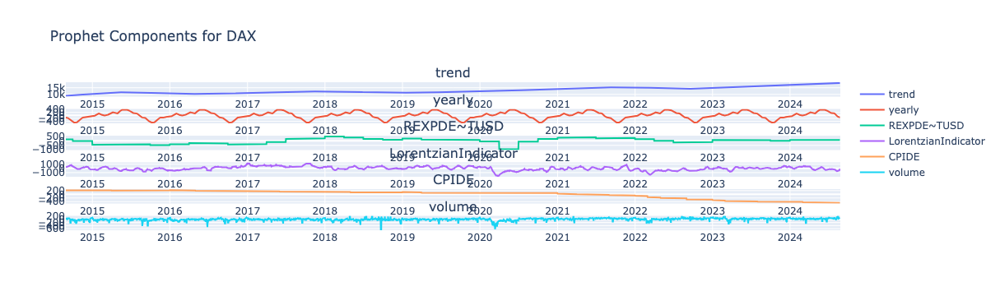


Regressor importance analysis skipped.


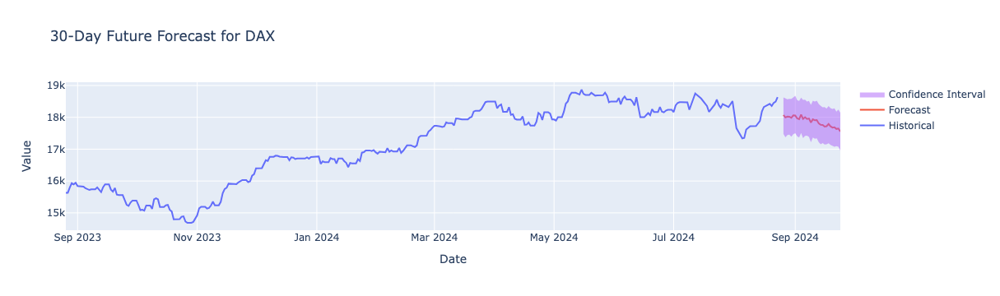


Future Predictions (next 30 days):
           ds          yhat    yhat_lower    yhat_upper
0  2024-08-26  18072.376217  17475.188480  18623.733289
1  2024-08-27  17996.168886  17374.425710  18596.189492
2  2024-08-28  18022.329375  17441.360894  18565.615660
3  2024-08-29  18019.252979  17457.047738  18578.122090
4  2024-08-30  17983.758633  17389.341567  18579.300713
5  2024-08-31  18062.263092  17469.446275  18623.687241
6  2024-09-01  18058.992385  17501.092589  18673.833705
7  2024-09-02  17965.341477  17403.613318  18540.204023
8  2024-09-03  17942.468429  17364.090791  18513.160654
9  2024-09-04  18082.900198  17507.646990  18616.969704
10 2024-09-05  17948.093139  17348.334088  18549.383779
11 2024-09-06  18002.905330  17414.096509  18551.813021
12 2024-09-07  17948.612229  17423.230610  18495.711602
13 2024-09-08  17964.435723  17384.545769  18514.986652
14 2024-09-09  17838.286771  17218.118233  18388.806188
15 2024-09-10  17937.304527  17365.597414  18520.184775
16 2024-09-1

In [60]:
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import datetime, timedelta

# Assuming your dataframe is named combined_df
df = combined_df.copy()

# Convert 'index' to datetime if it's not already
df['index'] = pd.to_datetime(df['index'])

# Filter for the last 10 years of data
ten_years_ago = datetime.now() - timedelta(days=365*10)
df = df[df['index'] >= ten_years_ago]

# Remove rows with NaN values
df = df.dropna()

# Rename columns to match Prophet's requirements
df = df.rename(columns={'index': 'ds', 'close': 'y'})

# Use only the specified features
selected_features = ['REXPDE~TUSD', 'LorentzianIndicator', 'CPIDE', 'volume']

print(f"Selected features: {selected_features}")

def train_prophet_model(df, regressors):
    model = Prophet(
        yearly_seasonality=True,
        weekly_seasonality=True,
        daily_seasonality=False,
        changepoint_prior_scale=0.01,
        seasonality_prior_scale=1.0,
        seasonality_mode='additive'
    )
    
    for regressor in regressors:
        model.add_regressor(regressor)
    
    model.fit(df)
    return model

# Train the model
model = train_prophet_model(df, selected_features)

# Get current date
current_date = datetime.now().date()

# Make predictions up to the current date
future = model.make_future_dataframe(periods=0)  # No future predictions
future = future.merge(df[['ds'] + selected_features], on='ds', how='left')
forecast = model.predict(future)

# Calculate performance metrics for historical fit
y_true = df['y']
y_pred = forecast['yhat']

mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_true, y_pred)
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print("\nHistorical Fit Performance Metrics:")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"MAPE: {mape:.2f}%")

# Perform cross-validation with adjusted parameters
total_days = (df['ds'].max() - df['ds'].min()).days
initial = f'{total_days // 2} days'  # Use half of the data for initial training
period = f'{total_days // 20} days'  # Step size of 1/20th of the data
horizon = f'{total_days // 10} days'  # Forecast 1/10th of the data ahead

print(f"\nCross-validation parameters:")
print(f"Initial: {initial}")
print(f"Period: {period}")
print(f"Horizon: {horizon}")

cv_results = cross_validation(model, initial=initial, period=period, horizon=horizon)
cv_metrics = performance_metrics(cv_results)

print("\nCross-Validation Performance Metrics:")
print(cv_metrics[['horizon', 'mse', 'rmse', 'mae', 'mape']].mean())

# Plot the results with Plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['ds'], y=df['y'], mode='lines', name='Actual'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], mode='lines', name='Forecast'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], mode='lines', line=dict(width=0), showlegend=False))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], mode='lines', fill='tonexty', line=dict(width=0), name='Confidence Interval'))
fig.update_layout(title='Prophet Forecast for DAX (Last 10 Years)', xaxis_title='Date', yaxis_title='Value', hovermode='x unified')
fig.update_xaxes(range=[df['ds'].min(), current_date])
fig.show()

# Plot component-wise effects
component_names = ['trend', 'yearly'] + selected_features
fig = make_subplots(rows=len(component_names), cols=1, subplot_titles=component_names)
for i, component in enumerate(component_names, 1):
    fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast[component], mode='lines', name=component), row=i, col=1)
fig.update_layout(height=300*len(component_names), title_text="Prophet Components for DAX", hovermode='x unified')
fig.update_xaxes(range=[df['ds'].min(), current_date])
fig.show()

# Analyze regressor importance
beta_values = model.params['beta'].flatten()
if len(beta_values) == len(selected_features):
    regressor_importance = pd.DataFrame({
        'regressor': selected_features,
        'importance': np.abs(beta_values)
    })
    regressor_importance = regressor_importance.sort_values('importance', ascending=False)
    print("\nRegressor Importance:")
    print(regressor_importance)

    # Plot regressor importance
    fig = go.Figure([go.Bar(x=regressor_importance['regressor'], y=regressor_importance['importance'])])
    fig.update_layout(title='Regressor Importance for DAX', xaxis_title='Regressor', yaxis_title='Absolute Importance')
    fig.show()
else:
    print(f"\nWarning: Mismatch between number of regressors ({len(selected_features)}) and beta values ({len(beta_values)})")
    print("Regressor importance analysis skipped.")

# Make future predictions (next 30 days)
future_dates = pd.date_range(start=current_date + timedelta(days=1), periods=30)
future_df = pd.DataFrame({'ds': future_dates})

# Estimate future regressor values
for regressor in selected_features:
    if regressor in ['REXPDE~TUSD', 'CPIDE']:
        # For economic indicators, use the last known value
        future_df[regressor] = df[regressor].iloc[-1]
    elif regressor == 'LorentzianIndicator':
        # For LorentzianIndicator, use a simple forecast (e.g., last 30-day trend)
        last_30_days = df[regressor].tail(30)
        trend = np.polyfit(range(30), last_30_days, 1)[0]
        future_df[regressor] = df[regressor].iloc[-1] + trend * np.arange(1, 31)
    elif regressor == 'volume':
        # For volume, use the average of the last 30 days, with some random variation
        avg_volume = df[regressor].tail(30).mean()
        std_volume = df[regressor].tail(30).std()
        future_df[regressor] = np.random.normal(avg_volume, std_volume, 30)

future_forecast = model.predict(future_df)

# Plot future predictions
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['ds'].tail(365), y=df['y'].tail(365), mode='lines', name='Historical'))
fig.add_trace(go.Scatter(x=future_forecast['ds'], y=future_forecast['yhat'], mode='lines', name='Forecast'))
fig.add_trace(go.Scatter(x=future_forecast['ds'], y=future_forecast['yhat_lower'], mode='lines', line=dict(width=0), showlegend=False))
fig.add_trace(go.Scatter(x=future_forecast['ds'], y=future_forecast['yhat_upper'], mode='lines', fill='tonexty', line=dict(width=0), name='Confidence Interval'))
fig.update_layout(title='30-Day Future Forecast for DAX', xaxis_title='Date', yaxis_title='Value', hovermode='x unified')
fig.update_xaxes(range=[current_date - timedelta(days=365), future_dates[-1]])
fig.show()

print("\nFuture Predictions (next 30 days):")
print(future_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

# Time-series AutoML with H2O

In [117]:
import h2o
from h2o.automl import H2OAutoML
import pandas as pd
import numpy as np
from datetime import datetime, timedelta

# Initialize H2O
h2o.init()

# Assuming your dataframe is named combined_df
df = combined_df.copy()

# Convert 'index' to datetime if it's not already
df['index'] = pd.to_datetime(df['index'])
df.set_index('index', inplace=True)

# Filter for the last 10 years of data
ten_years_ago = datetime.now() - timedelta(days=365*10)
df = df[df.index >= ten_years_ago]

# Function to calculate returns for CPIDE
def calculate_cpide_returns(series, periods):
    returns = series.pct_change(periods)
    mask = returns != 0
    idx = np.arange(len(returns))
    idx_valid = idx[mask]
    returns = pd.Series(np.interp(idx, idx_valid, returns[mask]), index=returns.index)
    return returns

# Feature Engineering
for col in ['close', 'REXPDE~TUSD', 'LorentzianIndicator', 'volume']:
    df[f'{col}_lag_1'] = df[col].shift(1)
    df[f'{col}_lag_7'] = df[col].shift(7)
    df[f'{col}_lag_30'] = df[col].shift(30)
    df[f'{col}_return_1'] = df[col].pct_change(1)
    df[f'{col}_return_7'] = df[col].pct_change(7)
    df[f'{col}_return_30'] = df[col].pct_change(30)

# Special handling for CPIDE
df['CPIDE_lag_1'] = df['CPIDE'].shift(1)
df['CPIDE_lag_7'] = df['CPIDE'].shift(7)
df['CPIDE_lag_30'] = df['CPIDE'].shift(30)
df['CPIDE_return_1'] = calculate_cpide_returns(df['CPIDE'], 1)
df['CPIDE_return_7'] = calculate_cpide_returns(df['CPIDE'], 7)
df['CPIDE_return_30'] = calculate_cpide_returns(df['CPIDE'], 30)

# Remove rows with NaN values
df = df.dropna()

# Set date as a separate column for H2O
df['date'] = df.index

# Select all features except 'close' and 'date'
features = [col for col in df.columns if col not in ['close', 'date']]
target = 'close'

print("Features used:", features)
print("\nDataFrame column types:")
print(df.dtypes)

# Convert to H2OFrame
h2o_df = h2o.H2OFrame(df)

print("\nH2OFrame column types:")
print(h2o_df.types)

# Split the data into train, validation, and test sets
train, valid, test = h2o_df.split_frame(ratios=[0.7, 0.15], seed=1234)

# Run AutoML
aml = H2OAutoML(max_runtime_secs=3600,  # 1 hour
                seed=1234,
                sort_metric='RMSE',
                stopping_rounds=20,
                stopping_tolerance=0.01,
                stopping_metric='RMSE',
                max_models=100,
                exclude_algos=['DeepLearning'],
                nfolds=0)

aml.train(x=features, y=target, training_frame=train, validation_frame=valid)

# Get the best model
best_model = aml.leader

print("\nBest model:", best_model)

# Save the model
model_path = h2o.save_model(model=best_model, path="./", force=True)
print(f"\nModel saved to: {model_path}")

# Don't shutdown H2O here if you plan to use it for predictions immediately after

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,56 mins 11 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.4
H2O_cluster_version_age:,1 month and 15 days
H2O_cluster_name:,H2O_from_python_marius_tlzho8
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,1.784 Gb
H2O_cluster_total_cores:,6
H2O_cluster_allowed_cores:,6
H2O_cluster_status:,"locked, healthy"


Features used: ['open', 'high', 'low', 'volume', 'vwap', 'adj_close', 'unadjusted_volume', 'change', 'change_percent', 'KalmanEstimate', 'LorentzianIndicator', 'REXPDE~TUSD', 'CPIDE', 'close_lag_1', 'close_lag_7', 'close_lag_30', 'close_return_1', 'close_return_7', 'close_return_30', 'REXPDE~TUSD_lag_1', 'REXPDE~TUSD_lag_7', 'REXPDE~TUSD_lag_30', 'REXPDE~TUSD_return_1', 'REXPDE~TUSD_return_7', 'REXPDE~TUSD_return_30', 'LorentzianIndicator_lag_1', 'LorentzianIndicator_lag_7', 'LorentzianIndicator_lag_30', 'LorentzianIndicator_return_1', 'LorentzianIndicator_return_7', 'LorentzianIndicator_return_30', 'volume_lag_1', 'volume_lag_7', 'volume_lag_30', 'volume_return_1', 'volume_return_7', 'volume_return_30', 'CPIDE_lag_1', 'CPIDE_lag_7', 'CPIDE_lag_30', 'CPIDE_return_1', 'CPIDE_return_7', 'CPIDE_return_30']

DataFrame column types:
open                                    float64
high                                    float64
low                                     float64
close           

In [120]:
import h2o
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from pykalman import KalmanFilter
import plotly.graph_objects as go

# Initialize H2O (if not already initialized)
h2o.init()

# Load the saved model
best_model = h2o.load_model("./GBM_grid_1_AutoML_4_20240825_152005_model_10")  # Use your actual model path

# Assuming df is your original dataframe used for training
# If it's not in memory, you'll need to load and preprocess it again

def forecast_feature_kalman(series, forecast_horizon):
    kf = KalmanFilter(transition_matrices=np.array([[1]]),
                      observation_matrices=np.array([[1]]),
                      initial_state_mean=np.array([series.iloc[-1]]),
                      initial_state_covariance=np.array([[1]]),
                      observation_covariance=np.array([[1]]),
                      transition_covariance=np.array([[0.01]]))
    
    state_means, _ = kf.filter(series.values.reshape(-1, 1))
    
    last_state = state_means[-1]
    forecast = np.zeros(forecast_horizon)
    for i in range(forecast_horizon):
        last_state = np.dot(kf.transition_matrices, last_state)
        forecast[i] = last_state.flatten()[0]
    
    return pd.Series(forecast, index=pd.date_range(start=series.index[-1] + pd.Timedelta(days=1), periods=forecast_horizon))

def generate_future_features(df, future_dates, features):
    future_df = pd.DataFrame(index=future_dates)
    
    # Forecast main features
    for feature in df.columns:
        if feature != 'date':
            if feature == 'CPIDE':
                future_df[feature] = df[feature].iloc[-1]
            else:
                future_df[feature] = forecast_feature_kalman(df[feature], len(future_dates))
    
    # Calculate derived features
    for feature in features:
        if '_lag_' in feature:
            base_feature, lag = feature.split('_lag_')
            future_df[feature] = future_df[base_feature].shift(int(lag))
        elif '_return_' in feature:
            base_feature, period = feature.split('_return_')
            future_df[feature] = future_df[base_feature].pct_change(int(period))
    
    future_df['date'] = future_dates
    
    # Ensure all dtypes match the original dataframe
    for col in future_df.columns:
        if col in df.columns:
            future_df[col] = future_df[col].astype(df[col].dtype)
    
    return future_df

# Generate future dates
last_date = df.index.max()
future_dates = pd.date_range(start=last_date + timedelta(days=1), periods=30)

# Generate future features
future_df = generate_future_features(df, future_dates, df.columns)

print("Future DataFrame column types:")
print(future_df.dtypes)

# Convert future DataFrame to H2OFrame
future_h2o = h2o.H2OFrame(future_df)

print("\nFuture H2OFrame column types:")
print(future_h2o.types)

# Make predictions
future_predictions = best_model.predict(future_h2o)
future_pred_df = h2o.as_list(future_predictions, use_pandas=True)

# Plot future predictions
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index[-365:], y=df['close'].tail(365), mode='lines', name='Historical'))
fig.add_trace(go.Scatter(x=future_dates, y=future_pred_df['predict'], mode='lines', name='Forecast'))
fig.update_layout(title='H2O AutoML: 30-Day Future Forecast for DAX', xaxis_title='Date', yaxis_title='Close Price')
fig.show()

print("\nFuture Predictions (next 30 days):")
print(pd.concat([future_df['date'], future_pred_df], axis=1))

# Shutdown H2O cluster
h2o.shutdown()

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,1 hour 13 mins
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.4
H2O_cluster_version_age:,1 month and 15 days
H2O_cluster_name:,H2O_from_python_marius_tlzho8
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,1.427 Gb
H2O_cluster_total_cores:,6
H2O_cluster_allowed_cores:,6
H2O_cluster_status:,"locked, healthy"


Future DataFrame column types:
open                                    float64
high                                    float64
low                                     float64
close                                   float64
volume                                  float64
vwap                                    float64
adj_close                               float64
unadjusted_volume                       float64
change                                  float64
change_percent                          float64
KalmanEstimate                          float64
LorentzianIndicator                     float64
REXPDE~TUSD                             float64
CPIDE                                   float64
close_lag_1                             float64
close_lag_7                             float64
close_lag_30                            float64
close_return_1                          float64
close_return_7                          float64
close_return_30                         float64
REXPDE~TU

OSError: Job with key $03017f00000132d4ffffffff$_8a43f9d4d026c494916fc4baa9e4fc2 failed with an exception: java.lang.IllegalArgumentException: Test/Validation dataset has categorical column 'close_lag_30' which is real-valued in the training data
stacktrace: 
java.lang.IllegalArgumentException: Test/Validation dataset has categorical column 'close_lag_30' which is real-valued in the training data
	at hex.Model.adaptTestForTrain(Model.java:1833)
	at hex.Model.adaptTestForTrain(Model.java:1643)
	at hex.Model.adaptTestForTrain(Model.java:1639)
	at hex.Model.adaptFrameForScore(Model.java:1981)
	at hex.Model.score(Model.java:1999)
	at water.api.ModelMetricsHandler$1.compute2(ModelMetricsHandler.java:555)
	at water.H2O$H2OCountedCompleter.compute(H2O.java:1704)
	at jsr166y.CountedCompleter.exec(CountedCompleter.java:468)
	at jsr166y.ForkJoinTask.doExec(ForkJoinTask.java:263)
	at jsr166y.ForkJoinPool$WorkQueue.runTask(ForkJoinPool.java:976)
	at jsr166y.ForkJoinPool.runWorker(ForkJoinPool.java:1479)
	at jsr166y.ForkJoinWorkerThread.run(ForkJoinWorkerThread.java:104)



Future DataFrame Data Types:
date                             datetime64[ns]
open                                    float64
high                                    float64
low                                     float64
volume                                  float64
vwap                                    float64
adj_close                               float64
unadjusted_volume                       float64
change                                  float64
change_percent                          float64
KalmanEstimate                          float64
LorentzianIndicator                     float64
REXPDE~TUSD                             float64
CPIDE                                   float64
close_lag_1                             float64
close_lag_7                             float64
close_lag_30                            float64
close_return_1                          float64
close_return_7                          float64
close_return_30                         float64
REXPDE~TUS

/home/marius/miniconda3/envs/openbb/lib/python3.11/site-packages/h2o/frame.py:1981: H2ODependencyWarning:

Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)




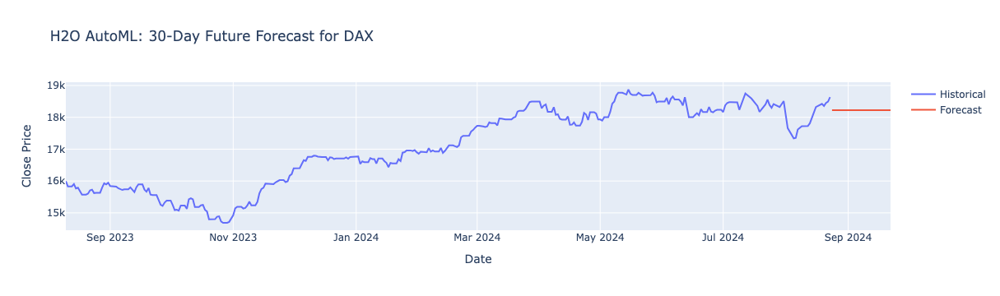


Future Predictions (next 30 days):
         date       predict
0  2024-08-24  18226.278084
1  2024-08-25  18226.278084
2  2024-08-26  18226.278084
3  2024-08-27  18226.278084
4  2024-08-28  18226.278084
5  2024-08-29  18224.811445
6  2024-08-30  18223.730802
7  2024-08-31  18223.500556
8  2024-09-01  18223.500556
9  2024-09-02  18223.500556
10 2024-09-03  18223.500556
11 2024-09-04  18223.500556
12 2024-09-05  18223.500556
13 2024-09-06  18223.345046
14 2024-09-07  18223.345046
15 2024-09-08  18223.345046
16 2024-09-09  18223.345046
17 2024-09-10  18223.345046
18 2024-09-11  18223.345046
19 2024-09-12  18223.345046
20 2024-09-13  18223.345046
21 2024-09-14  18223.345046
22 2024-09-15  18223.345046
23 2024-09-16  18223.345046
24 2024-09-17  18223.345046
25 2024-09-18  18223.345046
26 2024-09-19  18223.345046
27 2024-09-20  18223.345046
28 2024-09-21  18223.345046
29 2024-09-22  18223.345046


In [77]:
import h2o
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import plotly.graph_objects as go

# Assuming df and best_model are already defined

# Future predictions
last_date = df.index.max()
future_dates = pd.date_range(start=last_date + timedelta(days=1), periods=30)
future_df = pd.DataFrame(index=future_dates)

# Create future feature values
for feature in features:
    if feature in df.columns:
        future_df[feature] = np.zeros(30, dtype=np.float64)
    
    if 'lag' in feature:
        lag = int(feature.split('_')[-1])
        base_feature = feature.split('_')[0]
        future_df[feature] = [float(df[base_feature].iloc[-lag:].values[0])] * 30
    elif 'return' in feature:
        period = int(feature.split('_')[-1])
        base_feature = feature.split('_')[0]
        future_df[feature] = [float(df[feature].iloc[-period:].mean())] * 30
    elif feature in ['REXPDE~TUSD', 'CPIDE']:
        future_df[feature] = [float(df[feature].iloc[-1])] * 30
    elif feature in ['LorentzianIndicator', 'KalmanEstimate']:
        last_30_days = df[feature].tail(30)
        trend = np.polyfit(range(30), last_30_days, 1)[0]
        future_df[feature] = df[feature].iloc[-1] + trend * np.arange(1, 31)
    else:
        # For other features, use the average of the last 30 days
        future_df[feature] = [float(df[feature].tail(30).mean())] * 30

# Ensure all dtypes are float64
for col in future_df.columns:
    future_df[col] = future_df[col].astype(np.float64)

# Reset index and rename to 'date' for consistency
future_df.reset_index(inplace=True)
future_df.rename(columns={'index': 'date'}, inplace=True)

# Double-check data types
print("\nFuture DataFrame Data Types:")
print(future_df.dtypes)

# Convert future DataFrame to H2OFrame
future_h2o = h2o.H2OFrame(future_df)

# Force all columns except 'date' to be numeric
for col in future_h2o.columns:
    if col != "date":
        future_h2o[col] = future_h2o[col].asnumeric()

# Check column types after conversion
print("\nH2OFrame Column Types After Conversion:")
print(future_h2o.types)

# Make predictions
future_predictions = best_model.predict(future_h2o)
future_pred_df = h2o.as_list(future_predictions, use_pandas=True)

# Plot future predictions
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index[-365:], y=df['close'].tail(365), mode='lines', name='Historical'))
fig.add_trace(go.Scatter(x=future_dates, y=future_pred_df['predict'], mode='lines', name='Forecast'))
fig.update_layout(title='H2O AutoML: 30-Day Future Forecast for DAX', xaxis_title='Date', yaxis_title='Close Price')
fig.show()

print("\nFuture Predictions (next 30 days):")
print(pd.concat([future_df['date'], future_pred_df], axis=1))

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,11 mins 07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.4
H2O_cluster_version_age:,1 month and 15 days
H2O_cluster_name:,H2O_from_python_marius_st2i25
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,2.910 Gb
H2O_cluster_total_cores:,6
H2O_cluster_allowed_cores:,6
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
gbm prediction progress: |████████████████████████

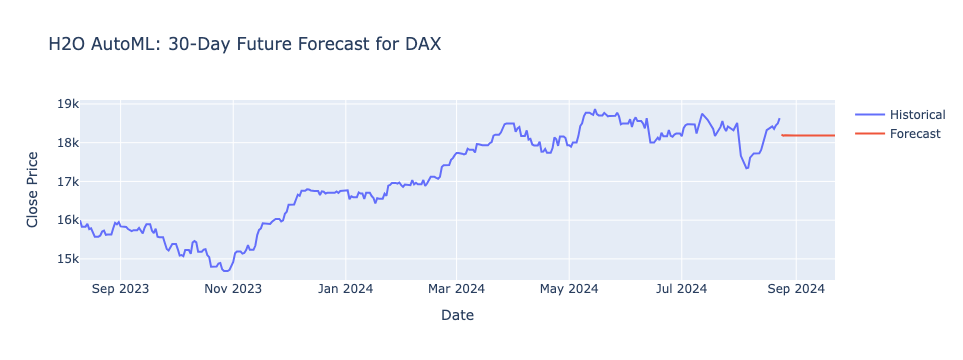


Future Predictions (next 30 days):
                   close
2024-08-24  18205.351114
2024-08-25  18182.966541
2024-08-26  18190.571284
2024-08-27  18186.453103
2024-08-28  18190.222285
2024-08-29  18192.257015
2024-08-30  18191.466112
2024-08-31  18186.231708
2024-09-01  18186.494394
2024-09-02  18186.132303
2024-09-03  18187.041985
2024-09-04  18185.973349
2024-09-05  18186.919488
2024-09-06  18186.009807
2024-09-07  18186.622702
2024-09-08  18185.994902
2024-09-09  18185.967859
2024-09-10  18186.274342
2024-09-11  18186.459516
2024-09-12  18186.305164
2024-09-13  18186.244685
2024-09-14  18185.393230
2024-09-15  18185.864517
2024-09-16  18185.551890
2024-09-17  18187.316431
2024-09-18  18186.252807
2024-09-19  18186.252807
2024-09-20  18185.715900
2024-09-21  18185.800903
2024-09-22  18186.538356
H2O session _sid_b283 closed.


/tmp/ipykernel_3518115/3684030009.py:100: H2ODeprecationWarning:

Deprecated, use ``h2o.cluster().shutdown()``.



In [127]:
import h2o
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from pykalman import KalmanFilter
import plotly.graph_objects as go

# Initialize H2O (if not already initialized)
h2o.init()

# Load the saved model
best_model = h2o.load_model("./GBM_grid_1_AutoML_4_20240825_152005_model_10")  # Use your actual model path

def forecast_feature_kalman(series, forecast_horizon=1):
    kf = KalmanFilter(transition_matrices=np.array([[1]]),
                      observation_matrices=np.array([[1]]),
                      initial_state_mean=np.array([series.iloc[-1]]),
                      initial_state_covariance=np.array([[1]]),
                      observation_covariance=np.array([[1]]),
                      transition_covariance=np.array([[0.01]]))
    
    state_means, _ = kf.filter(series.values.reshape(-1, 1))
    
    last_state = state_means[-1]
    forecast = np.zeros(forecast_horizon)
    for i in range(forecast_horizon):
        last_state = np.dot(kf.transition_matrices, last_state)
        forecast[i] = last_state.flatten()[0]
    
    return forecast[0]

def generate_next_day_features(df, last_date, features):
    next_day = pd.DataFrame(index=[last_date + timedelta(days=1)])
    
    for feature in features:
        if feature == 'date':
            next_day[feature] = next_day.index[0]
        elif '_lag_' in feature:
            base_feature, lag = feature.split('_lag_')
            lag = int(lag)
            next_day[feature] = df[base_feature].iloc[-lag] if len(df) > lag else df[base_feature].iloc[-1]
        elif '_return_' in feature:
            base_feature, period = feature.split('_return_')
            period = int(period)
            if len(df) >= period:
                current_value = df[base_feature].iloc[-1]
                past_value = df[base_feature].iloc[-period]
                # Use np.divide with a where condition to avoid division by zero
                return_value = np.divide(current_value - past_value, past_value, 
                                         out=np.zeros_like(current_value, dtype=float), 
                                         where=past_value!=0)
                next_day[feature] = return_value
            else:
                next_day[feature] = 0  # Use 0 as default return if not enough data
        elif feature != 'close':
            next_day[feature] = forecast_feature_kalman(df[feature])
    
    return next_day

# Assuming df is your original dataframe with historical data
# Make sure df is sorted by date and the index is a DatetimeIndex

# Initialize future DataFrame with last 30 days of historical data
future_df = df.tail(30).copy()
future_dates = pd.date_range(start=df.index[-1] + timedelta(days=1), periods=30)

for future_date in future_dates:
    next_day = generate_next_day_features(future_df, future_df.index[-1], df.columns)
    
    # Convert to H2OFrame and make prediction
    h2o_next_day = h2o.H2OFrame(next_day)
    for col in h2o_next_day.columns:
        if col != 'date':
            h2o_next_day[col] = h2o_next_day[col].asnumeric()
    
    prediction = best_model.predict(h2o_next_day)
    # Use multi-threaded conversion
    pred_df = prediction.as_data_frame(use_pandas=True, use_multi_thread=True)
    next_day['close'] = pred_df['predict'].values[0]
    
    future_df = pd.concat([future_df, next_day])

# Keep only the future predictions
future_predictions = future_df.iloc[-30:]

print("Future DataFrame first few rows:")
print(future_predictions.head())

# Plot future predictions
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index[-365:], y=df['close'].tail(365), mode='lines', name='Historical'))
fig.add_trace(go.Scatter(x=future_predictions.index, y=future_predictions['close'], mode='lines', name='Forecast'))
fig.update_layout(title='H2O AutoML: 30-Day Future Forecast for DAX', xaxis_title='Date', yaxis_title='Close Price')
fig.show()

print("\nFuture Predictions (next 30 days):")
print(future_predictions[['close']])

# Shutdown H2O cluster
h2o.shutdown()

# Kalman estimate

In [149]:
df = combined_df.iloc[-365:]
print(df.dtypes)

index                  datetime64[ns]
open                          float64
high                          float64
low                           float64
close                         float64
volume                        float64
vwap                          float64
adj_close                     float64
unadjusted_volume             float64
change                        float64
change_percent                float64
KalmanEstimate                float64
LorentzianIndicator           float64
REXPDE~TUSD                   float64
CPIDE                         float64
dtype: object


In [150]:
print(df.head(1))

           index      open      high       low     close      volume  \
11911 2023-08-12  15927.79  15962.45  15803.08  15832.17  60296700.0   

           vwap  adj_close  unadjusted_volume  change  change_percent  \
11911  15881.37   15832.17         60296700.0  -95.62       -0.006003   

       KalmanEstimate  LorentzianIndicator  REXPDE~TUSD  CPIDE  
11911    16021.801098             5.274866     441556.0  117.5  


In [151]:
print(df.index.dtype)

int64


In [159]:
import numpy as np
from pykalman import KalmanFilter

# Assuming df is your DataFrame with a 'close' column

# Initialize Kalman Filter
kf = KalmanFilter(
    initial_state_mean=df['close'].iloc[0],
    initial_state_covariance=1,
    transition_matrices=[1],
    observation_matrices=[1],
    observation_covariance=1,
    transition_covariance=0.01
)

# Filter the data
filtered_state_means, filtered_state_covariances = kf.filter(df['close'])

# Get the last filtered state
last_state_mean = filtered_state_means[-1]
last_state_covariance = filtered_state_covariances[-1]

# Predict the next state
next_state_mean, next_state_covariance = kf.filter_update(
    filtered_state_mean=last_state_mean,
    filtered_state_covariance=last_state_covariance
)

print(f"Estimate for the next value: {next_state_mean[0]}")

Estimate for the next value: 18199.13689976488


In [160]:
import numpy as np
from pykalman import KalmanFilter

# Assuming df is your DataFrame with a 'close' column

# Initialize Kalman Filter
kf = KalmanFilter(
    initial_state_mean=df['high'].iloc[0],
    initial_state_covariance=1,
    transition_matrices=[1],
    observation_matrices=[1],
    observation_covariance=1,
    transition_covariance=0.01
)

# Filter the data
filtered_state_means, filtered_state_covariances = kf.filter(df['high'])

# Get the last filtered state
last_state_mean = filtered_state_means[-1]
last_state_covariance = filtered_state_covariances[-1]

# Predict the next state
next_state_mean, next_state_covariance = kf.filter_update(
    filtered_state_mean=last_state_mean,
    filtered_state_covariance=last_state_covariance
)

print(f"Estimate for the next value: {next_state_mean[0]}")

Estimate for the next value: 18271.87958586028


In [161]:
import numpy as np
from pykalman import KalmanFilter

# Assuming df is your DataFrame with a 'close' column

# Initialize Kalman Filter
kf = KalmanFilter(
    initial_state_mean=df['close'].iloc[0],
    initial_state_covariance=1,
    transition_matrices=[1],
    observation_matrices=[1],
    observation_covariance=1,
    transition_covariance=0.01
)

# Filter the data
filtered_state_means, filtered_state_covariances = kf.filter(df['close'])

# Get the last filtered state
last_state_mean = filtered_state_means[-1]
last_state_covariance = filtered_state_covariances[-1]

# Predict the next state
next_state_mean, next_state_covariance = kf.filter_update(
    filtered_state_mean=last_state_mean,
    filtered_state_covariance=last_state_covariance
)

print(f"Estimate for the next value: {next_state_mean[0]}")

Estimate for the next value: 18199.13689976488


# Buy / sell signals for the Dax

In [162]:
import pandas as pd
import numpy as np
import talib as ta

In [173]:
df = combined_df.iloc[-365:].copy()
print(df.dtypes)


open                   float64
high                   float64
low                    float64
close                  float64
volume                 float64
vwap                   float64
adj_close              float64
unadjusted_volume      float64
change                 float64
change_percent         float64
KalmanEstimate         float64
LorentzianIndicator    float64
REXPDE~TUSD            float64
CPIDE                  float64
dtype: object


In [164]:
def ma(ma_type, src, length, volume=None):
    if ma_type == 'SMA':
        return ta.SMA(src, timeperiod=length)
    elif ma_type == 'EMA':
        return ta.EMA(src, timeperiod=length)
    elif ma_type == 'DEMA':
        return ta.DEMA(src, timeperiod=length)
    elif ma_type == 'TEMA':
        return ta.TEMA(src, timeperiod=length)
    elif ma_type == 'WMA':
        return ta.WMA(src, timeperiod=length)
    elif ma_type == 'VWMA':
        if volume is None:
            raise ValueError("Volume data is required for VWMA")
        return ta.SMA(src * volume, timeperiod=length) / ta.SMA(volume, timeperiod=length)
    elif ma_type == 'SMMA':
        return ta.SMA(src, timeperiod=length)
    elif ma_type == 'HMA':
        return ta.WMA(2 * ta.WMA(src, timeperiod=length // 2) - ta.WMA(src, timeperiod=length), timeperiod=int(np.sqrt(length)))
    elif ma_type == 'LSMA':
        return ta.LINEARREG(src, timeperiod=length)
    elif ma_type == 'PEMA':
        ema1 = ta.EMA(src, timeperiod=length)
        ema2 = ta.EMA(ema1, timeperiod=length)
        ema3 = ta.EMA(ema2, timeperiod=length)
        ema4 = ta.EMA(ema3, timeperiod=length)
        ema5 = ta.EMA(ema4, timeperiod=length)
        ema6 = ta.EMA(ema5, timeperiod=length)
        ema7 = ta.EMA(ema6, timeperiod=length)
        ema8 = ta.EMA(ema7, timeperiod=length)
        return 8 * ema1 - 28 * ema2 + 56 * ema3 - 70 * ema4 + 56 * ema5 - 28 * ema6 + 8 * ema7 - ema8
    else:
        raise ValueError(f"Unknown MA Type: {ma_type}")


In [165]:
def kalman_filter(df, sharpness, k_period):
    df.loc[:, 'kfilt'] = 0.0
    df.loc[:, 'velocity'] = 0.0
    for i in range(1, len(df)):
        distance = df['close'].iloc[i] - df['kfilt'].iloc[i - 1]
        error = df['kfilt'].iloc[i - 1] + distance * np.sqrt(sharpness * k_period / 100)
        velocity = df['velocity'].iloc[i - 1] + distance * k_period / 100
        df.loc[df.index[i], 'kfilt'] = error + velocity
        df.loc[df.index[i], 'velocity'] = velocity
    return df['kfilt']


In [166]:
def calculate_roc(df, length):
    return ta.ROC(df['kfilt'], timeperiod=length)


In [167]:
def calculate_stochastic(df, periodK, smoothK, periodD):
    k, d = ta.STOCH(df['high'], df['low'], df['close'],
                    fastk_period=periodK,
                    slowk_period=smoothK, 
                    slowk_matype=0,
                    slowd_period=periodD,
                    slowd_matype=0)
    return k, d


In [168]:
def calculate_blend(df, ma_type, smoothlen):
    roc = calculate_roc(df, length=9)  # Assuming length=9
    _, d = calculate_stochastic(df, periodK=14, smoothK=1, periodD=3)  # Default values
    blend = (roc + d) / 2
    blend = ma(ma_type, blend, smoothlen)
    blend = blend.dropna()  # Drop NaN values that could arise from insufficient data
    return blend


In [169]:
def generate_signals(df, blend):
    df.loc[:, 'buy_signal'] = np.where((blend > blend.shift(1)) & (blend.shift(1) <= blend.shift(2)), 1, 0)
    df.loc[:, 'sell_signal'] = np.where((blend < blend.shift(1)) & (blend.shift(1) >= blend.shift(2)), 1, 0)
    return df


In [170]:
def analyze(df, ma_type='TEMA', smoothlen=12, sharpness=25.0, k_period=1.0):
    df['kfilt'] = kalman_filter(df, sharpness, k_period)
    blend = calculate_blend(df, ma_type, smoothlen)
    df['blend'] = blend
    df = generate_signals(df, blend)
    df = df.dropna(subset=['blend'])  # Drop rows where 'blend' is NaN
    return df[['buy_signal', 'sell_signal']]  # Return only the buy and sell signals


In [174]:
# Analyze and print only the buy and sell signals
signal_df = analyze(df)
print(signal_df)


                    open          high           low         close  \
2023-08-19  15597.120000  15612.880000  15468.650000  15574.260000   
2023-08-20  15597.120000  15612.880000  15468.650000  15574.260000   
2023-08-21  15573.950000  15710.210000  15571.820000  15603.280000   
2023-08-22  15684.640000  15799.340000  15677.440000  15705.620000   
2023-08-23  15761.250000  15820.950000  15672.430000  15728.410000   
...                  ...           ...           ...           ...   
2024-08-26  18470.006463  18582.574769  18450.405407  18537.821152   
2024-08-27  18470.149396  18582.209304  18451.668874  18537.641506   
2024-08-28  18470.316624  18582.192740  18451.403439  18537.936833   
2024-08-29  18470.645896  18583.090019  18451.158720  18538.491185   
2024-08-30  18471.650998  18582.831214  18451.680800  18538.901426   

                  volume          vwap     adj_close  unadjusted_volume  \
2023-08-19  5.990950e+07  15563.230000  15574.260000       5.990950e+07   
2023-08-2

In [175]:
import plotly.graph_objs as go
import plotly.express as px

# Example: Assuming 'df' is the DataFrame after analysis and contains the 'buy_signal' and 'sell_signal' columns
# and 'close' column to plot the price



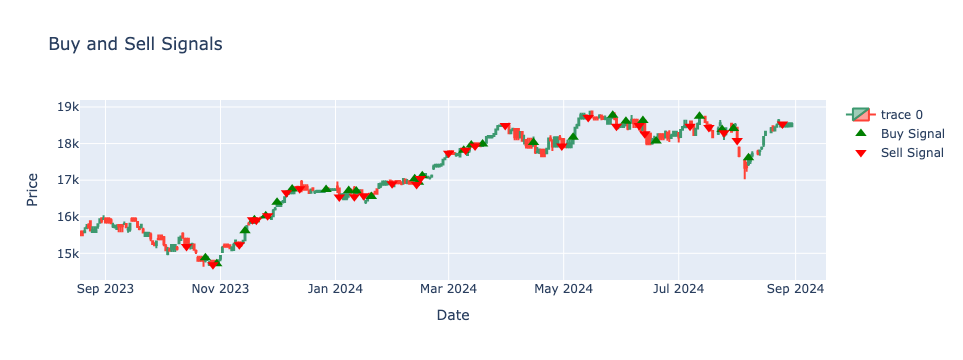

In [176]:
def plot_signals(df):
    # Create a candlestick chart
    fig = go.Figure(data=[go.Candlestick(x=df.index,
                                         open=df['open'],
                                         high=df['high'],
                                         low=df['low'],
                                         close=df['close'])])

    # Add Buy signals as green up arrows
    buy_signals = df[df['buy_signal'] == 1]
    fig.add_trace(go.Scatter(x=buy_signals.index,
                             y=buy_signals['close'],
                             mode='markers',
                             marker=dict(symbol='triangle-up', color='green', size=10),
                             name='Buy Signal'))

    # Add Sell signals as red down arrows
    sell_signals = df[df['sell_signal'] == 1]
    fig.add_trace(go.Scatter(x=sell_signals.index,
                             y=sell_signals['close'],
                             mode='markers',
                             marker=dict(symbol='triangle-down', color='red', size=10),
                             name='Sell Signal'))

    # Update layout for better visuals
    fig.update_layout(title='Buy and Sell Signals',
                      xaxis_title='Date',
                      yaxis_title='Price',
                      xaxis_rangeslider_visible=False)

    # Show the plot
    fig.show()

# Assuming signal_df contains the 'buy_signal' and 'sell_signal' columns along with price data
plot_signals(df)


In [177]:
def get_signal_list(df):
    # Create an empty list to store the signals
    signals = []
    
    # Iterate through the DataFrame and check for buy and sell signals
    for index, row in df.iterrows():
        if row['buy_signal'] == 1:
            signals.append({'Date': index, 'Signal': 'Buy', 'Price': row['close']})
        elif row['sell_signal'] == 1:
            signals.append({'Date': index, 'Signal': 'Sell', 'Price': row['close']})
    
    return signals


In [178]:
# Assuming df contains the 'buy_signal' and 'sell_signal' columns
signal_list = get_signal_list(df)

# Display the signal list
for signal in signal_list:
    print(f"Date: {signal['Date']}, Signal: {signal['Signal']}, Price: {signal['Price']}")


Date: 2023-10-14 00:00:00, Signal: Sell, Price: 15186.66016
Date: 2023-10-24 00:00:00, Signal: Buy, Price: 14879.94043
Date: 2023-10-28 00:00:00, Signal: Sell, Price: 14687.41016
Date: 2023-10-30 00:00:00, Signal: Buy, Price: 14716.54004
Date: 2023-11-11 00:00:00, Signal: Sell, Price: 15234.38965
Date: 2023-11-14 00:00:00, Signal: Buy, Price: 15614.42969
Date: 2023-11-18 00:00:00, Signal: Sell, Price: 15919.16016
Date: 2023-11-19 00:00:00, Signal: Buy, Price: 15919.16016
Date: 2023-11-20 00:00:00, Signal: Sell, Price: 15901.33008
Date: 2023-11-25 00:00:00, Signal: Buy, Price: 16029.49023
Date: 2023-11-26 00:00:00, Signal: Sell, Price: 16029.49023
Date: 2023-12-01 00:00:00, Signal: Buy, Price: 16397.51953
Date: 2023-12-06 00:00:00, Signal: Sell, Price: 16656.43945
Date: 2023-12-09 00:00:00, Signal: Buy, Price: 16759.2207
Date: 2023-12-13 00:00:00, Signal: Sell, Price: 16766.05078
Date: 2023-12-27 00:00:00, Signal: Buy, Price: 16742.07031
Date: 2024-01-03 00:00:00, Signal: Sell, Price: 1

## Backtest

In [191]:
initial_depot = 10000  # Initial depot in Euros
depot = initial_depot  # Current depot value
position_size_percentage = 0.03   # 3% of the depot for each trade
stop_loss_points = 100  # Stop loss of 100 points
dax_data = df['close']  # Assuming 'close' is the DAX price column

# Generate the signal list as in the previous steps
signal_list = get_signal_list(df)


In [192]:
from datetime import timedelta

# Initialize variables
current_position = None  # Track whether in a buy or sell position
entry_price = None  # Track the price at which the position was entered
entry_date = None  # Track the date at which the position was entered
results = []  # Store results of each trade

for signal in signal_list:
    signal_date = signal['Date']
    signal_type = signal['Signal']
    signal_price = signal['Price']
    
    if signal_type == 'Buy':
        if current_position is None:  # Enter a new long position
            position_size = depot * position_size_percentage
            entry_price = signal_price
            entry_date = signal_date
            current_position = 'long'
            results.append({
                'Date': signal_date,
                'Action': 'Buy',
                'Entry Price': entry_price,
                'Position Size': position_size,
                'Depot': depot
            })
    
    elif signal_type == 'Sell':
        if current_position == 'long':  # Exit the long position
            profit = (signal_price - entry_price) * (position_size / entry_price)
            depot += profit
            results.append({
                'Date': signal_date,
                'Action': 'Sell',
                'Exit Price': signal_price,
                'Profit': profit,
                'Depot': depot
            })
            current_position = None
    
    # Implement stop loss logic
    if current_position == 'long' and signal_price <= entry_price - stop_loss_points:
        # Sell the position if stop loss is hit
        loss = (entry_price - (entry_price - stop_loss_points)) * (position_size / entry_price)
        depot -= loss
        results.append({
            'Date': signal_date,
            'Action': 'Stop Loss Triggered',
            'Exit Price': entry_price - stop_loss_points,
            'Loss': loss,
            'Depot': depot
        })
        current_position = None
    
    # Automatically close the position after 2 days
    if current_position == 'long' and (signal_date - entry_date).days >= 2:
        profit = (signal_price - entry_price) * (position_size / entry_price)
        depot += profit
        results.append({
            'Date': signal_date,
            'Action': 'Auto Close After 2 Days',
            'Exit Price': signal_price,
            'Profit': profit,
            'Depot': depot
        })
        current_position = None


In [193]:
# Display the results
for trade in results:
    profit_loss = trade.get('Profit', trade.get('Loss', 'N/A'))
    # Only format profit_loss if it's a number
    if isinstance(profit_loss, (int, float)):
        profit_loss = f"{profit_loss:.2f}"
    
    print(f"Date: {trade['Date']}, Action: {trade['Action']}, "
          f"Entry Price: {trade.get('Entry Price', 'N/A')}, "
          f"Exit Price: {trade.get('Exit Price', 'N/A')}, "
          f"Profit/Loss: {profit_loss}, "
          f"Depot: {trade['Depot']:.2f}")

# Print the final depot value
print(f"\nFinal Depot Value: {depot:.2f} Euros")


Date: 2023-10-24 00:00:00, Action: Buy, Entry Price: 14879.94043, Exit Price: N/A, Profit/Loss: N/A, Depot: 10000.00
Date: 2023-10-28 00:00:00, Action: Sell, Entry Price: N/A, Exit Price: 14687.41016, Profit/Loss: -3.88, Depot: 9996.12
Date: 2023-10-30 00:00:00, Action: Buy, Entry Price: 14716.54004, Exit Price: N/A, Profit/Loss: N/A, Depot: 9996.12
Date: 2023-11-11 00:00:00, Action: Sell, Entry Price: N/A, Exit Price: 15234.38965, Profit/Loss: 10.55, Depot: 10006.67
Date: 2023-11-14 00:00:00, Action: Buy, Entry Price: 15614.42969, Exit Price: N/A, Profit/Loss: N/A, Depot: 10006.67
Date: 2023-11-18 00:00:00, Action: Sell, Entry Price: N/A, Exit Price: 15919.16016, Profit/Loss: 5.86, Depot: 10012.53
Date: 2023-11-19 00:00:00, Action: Buy, Entry Price: 15919.16016, Exit Price: N/A, Profit/Loss: N/A, Depot: 10012.53
Date: 2023-11-20 00:00:00, Action: Sell, Entry Price: N/A, Exit Price: 15901.33008, Profit/Loss: -0.34, Depot: 10012.19
Date: 2023-11-25 00:00:00, Action: Buy, Entry Price: 16